# Prepare some things
## Load some modules

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from keras.utils import to_categorical

from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
# from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import MinMaxScaler
# import sklearn.metrics

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import sys
sys.path.append('../')
from models import get_autoencoder_model, get_dec_model, get_vade_models, compute_p, compute_delta
from clustering_metrics import evaluate_clustering
from draw_embeddings import draw_multiple_labels

In [3]:
# Disable warnings output (TSNE outputs one very time)
import warnings
warnings.filterwarnings('ignore')

## Load the data

In [4]:
data_file = "../DO_NOT_PUBLISH/MetaboData_pseudoID.xlsx"
metabol = pd.read_excel(data_file, sheet_name="metabs", index_col=0).T
# Min-max normalization
metabol.iloc[:,:] = MinMaxScaler().fit_transform(metabol)
metabol.head()

,glycine,alanine,valine,leucine,isoleucine,serine,threonine,proline,arginine,glutamic,...,tcc,m_bu_p,mehp,x4_hpb,ibp,cibp,apap,apap_g,dcf,hctz
S000178_1,0.203059,0.111499,0.191536,0.250043,0.257227,0.298541,0.066532,0.136444,0.188422,0.174716,...,0.0,0.271801,0.266637,0.161973,0.0,0.0,0.018271,0.028760,0.296658,0.0
S000443_1,0.073279,0.115869,0.132288,0.149303,0.148693,0.084232,0.022798,0.092352,0.025114,0.074864,...,0.0,0.221467,0.197153,0.129863,0.0,0.0,0.009566,0.010220,0.199715,0.0
S000491_1,0.212805,0.304089,0.249373,0.263820,0.277999,0.385945,0.242866,0.262947,0.085272,0.116247,...,0.0,0.431987,0.480285,0.612164,0.0,0.0,0.030228,0.060776,0.349946,0.0
S000732_1,0.136319,0.715659,0.582759,0.654555,0.671802,0.386421,0.549783,0.517717,0.404796,0.199605,...,0.0,0.168995,0.150266,0.189479,0.0,0.0,0.001626,0.004522,0.348757,0.0
S000732_2,0.178756,0.387277,0.334169,0.344584,0.369569,0.187183,0.546836,0.228796,0.201617,0.165235,...,0.0,0.123065,0.164727,0.188603,0.0,0.0,0.081787,0.212806,0.369097,0.0


In [5]:
samples = pd.read_excel(data_file, sheet_name="samples", index_col=0)

# Drop the observations cointaining missing values:
drop_index = samples[samples['CVrisk3'].isna()].index
metabol.drop(drop_index, inplace=True, errors="ignore")
# Subset only the indeces present in the metabol data set
samples = samples.loc[metabol.index,:]

# Code gender as 0, 1
samples['gender'] = samples['gender'] -1
# Code CVrisk3 as 0, 1, 2
samples['CVrisk3'] = pd.Categorical(samples['CVrisk3'], categories=('Low','Med','Hig')).codes
# Convert time_origin to categorical type
samples['time_origin'] = pd.Categorical(samples['time_origin'], categories=('baseline','six','twelve'))

samples.head()

,X.SampleID,KKHNGID,time_origin,gender,pred_risk,CVrisk3,AGE,SCBIA1,SCANT2,SCBIA4,TG,HDL,LDL,CHO,HBA1CPC,SCBP1,SCBP2,HSCRP,CR
S000178_1,S000178_1,20161,baseline,0,0.020379,2,51,22.52,90.0,10.15,1.13,1.68,4.94,6.87,5.1,125,90,0.71,77.0
S000443_1,S000443_1,3557,baseline,1,0.000580,0,41,23.06,96.8,33.33,1.30,1.68,2.78,4.29,5.5,113,78,0.32,63.0
S000491_1,S000491_1,1783,baseline,1,0.001671,1,47,22.15,92.3,30.20,0.90,1.46,2.80,4.69,5.3,117,82,0.78,65.0
S000732_1,S000732_1,104735,baseline,1,0.000308,0,38,22.90,87.6,30.42,1.38,1.94,1.56,3.54,5.2,109,83,2.86,70.0
S000732_2,S000732_2,104735,six,1,0.000398,0,39,23.34,102.5,31.41,1.10,1.86,1.65,3.82,4.9,117,83,2.13,78.0


In [6]:
print("Number of observations:", metabol.shape[0])
print("Number of variables:", metabol.shape[1])
print("Number of data points:", np.multiply(*metabol.shape))

Number of observations: 1020
Number of variables: 411
Number of data points: 419220


# Deep clustering models

In [7]:
def clusters_by_individual(samples, labels):
    """
    Computes the corrected ratio of individuals that where assigned only one cluster.
    Groups the observations by individual,
    if all the observations in the group have been assigned to the same cluster,   
    corrects for the probabilty of each cluster
    and the number of observations in the group.
    """
    labels = pd.Series(labels)
    df = pd.DataFrame({"id":[i[:-2] for i in samples.index],
                       "label": labels})
    ratio = 0
    for i in set(df.id):
        clusters = df.label[df.id==i]
        if len(set(clusters)) == 1:
            prob_cluster = labels.value_counts()[list(set(clusters))[0]] / len(labels)
            ratio_num_obs = len(clusters)/len(df.id)
            ratio += 1 * prob_cluster * ratio_num_obs
    return(ratio)


def compute_metrics(rl_method, clust_method, n_clusters, var_name, data, labels, clusters, samples):
    """
    Computes Accuracy, ARI, AMI, silhouette
    and ratio of individuals that where assigned only one cluster.
    Prints them nicely and returns a dictionary.
    """
    metrics = evaluate_clustering(data, labels, clusters, False)
    ratio = clusters_by_individual(samples, clusters)
    print(name,
          [f'{metric}: {value:.3f}' for metric, value in metrics.items()],
          f'[Same clust.: {ratio:.3f}]')
    results = {"rl_method": rl_method, 
               "clust_method": clust_method, 
               "n_clusters": n_clusters, 
               "variable": var_name,
               "same_clust": ratio}
    results.update(metrics)
    return results

In [8]:
# Convert to numpy for better compatibility with Tensorflow
data = metabol.to_numpy()

cluster_numbers = (2, 3)
true_labels = {'gender': samples['gender'],
               'cv_risk': samples['CVrisk3']}
cluster_labels = []
results = []

## DEC

In [9]:
def dec_callback(epoch, logs):
    global p
    global c_last
    
    if (epoch+1) % SCHEDULE == 0:
        q = model_dec.soft_assignment(data)
        p = compute_p(q)
        
        c_new = q.numpy().argmax(1)
        delta = compute_delta(c_new, c_last)
        c_last = np.copy(c_new)
        # print(f"Delta: {delta:.3f}", end=" ")
        if (delta < DELTA_THRESHOLD):
            model_dec.stop_training = True
            
callback = tf.keras.callbacks.LambdaCallback(on_epoch_end=dec_callback)

In [10]:
INPUT_DIM = data.shape[1]
INTERMEDIATE_DIMS = (16, 32)

EPOCHS_PRETRAIN = 50
LEARNING_RATE_PRETRAIN = 1
MOMENTUM_PRETRAIN = 0.9

EPOCHS_FINETUNE = 200
LEARNING_RATE_FINETUNE = 1e-2
MOMENTUM_FINETUNE = 0.4

BATCH_SIZE = 32
SCHEDULE = 10
DELTA_THRESHOLD = 0.001

K=2 - Pretraining AE [loss: 0.0101] - Fine-tunning DEC [loss: 0.2640]
gender ['Acc: 0.548', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.958'] [Same clust.: 0.354]
K=3 - Pretraining AE [loss: 0.0098] - Fine-tunning DEC [loss: 0.7835]
cv_risk ['Acc: 0.360', 'ARI: 0.000', 'AMI: 0.004', 'Sil: 0.928'] [Same clust.: 0.152]


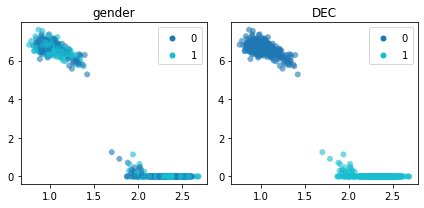

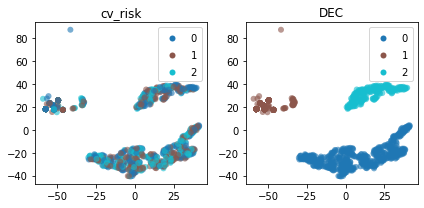

In [11]:
rl_method = "DEC"
clust_method = "K-Means"
verbose = 0

for k, (name, labels) in zip (cluster_numbers, true_labels.items()):
    LATENT_DIM = k
    N_CLUSTERS = k
    
    # Construct and pretrain AE
    print(f"K={k} - Pretraining AE", end=" ")
    model_ae = get_autoencoder_model(INPUT_DIM, LATENT_DIM, INTERMEDIATE_DIMS)
    optimizer = keras.optimizers.SGD(learning_rate=LEARNING_RATE_PRETRAIN,
                                     momentum=MOMENTUM_PRETRAIN)
    loss = "mse"
    model_ae.compile(optimizer=optimizer, loss=loss)
    history = model_ae.fit(data, data,
                           epochs=EPOCHS_PRETRAIN,
                           batch_size=BATCH_SIZE,
                           verbose=verbose)
    print(f"[loss: {history.history['loss'][-1]:.4f}]", end=" ")
    
    # Construct DEC
    print("- Fine-tunning DEC", end=" ")
    model_dec = get_dec_model(model_ae.encoder, N_CLUSTERS)
    
    # Initialize parameters
    z_dec = model_dec.encode(data)
    kmeans = KMeans(n_clusters=N_CLUSTERS, n_init=30)
    kmeans.fit(z_dec)
    for weight in model_dec.trainable_weights:
        if weight.name == "centroids:0":
            weight.assign(K.constant(kmeans.cluster_centers_))

    p = compute_p(to_categorical(kmeans.labels_))
    c_last = kmeans.labels_

    # Fine-tune the model
    optimizer = keras.optimizers.SGD(learning_rate=LEARNING_RATE_FINETUNE, 
                                     momentum=MOMENTUM_FINETUNE)
    model_dec.compile(optimizer=optimizer)
    history = model_dec.fit(data, p,
                            epochs=EPOCHS_FINETUNE,
                            batch_size=BATCH_SIZE,
                            callbacks = callback,
                            verbose=verbose)
    print(f"[loss: {history.history['loss'][-1]:.4f}]")
    
    # Compute the cluster assignments
    c_dec = model_dec.classify(data)
    cluster_labels.append({"rl_method": rl_method, 
                           "clust_method": clust_method, 
                           "n_clusters": k, 
                           "labels": c_dec})
    
    # Compute metrics
    z_dec = model_dec.encode(data)
    results.append(compute_metrics(rl_method, clust_method, k, name, z_dec, labels, c_dec, samples))
    
    # Draw the embeddings
    if k == 2:
        points = z_dec
    else:
        tsne = TSNE(n_components=2, init='pca')
        points = tsne.fit_transform(z_dec)

    show_labels = {name: labels.to_numpy(),
                   rl_method: c_dec}
    draw_multiple_labels(points, show_labels, subplot_size=(3,3), alpha=0.6)

## VaDE

In [12]:
def scheduler(epoch, lr):
    if (epoch+1) % SCHEDULE == 0:
        lr = lr * 0.9
    return lr

callback = [tf.keras.callbacks.LearningRateScheduler(scheduler),]

In [13]:
INPUT_DIM = data.shape[1]
INTERMEDIATE_DIMS = (16, 32)

EPOCHS_PRETRAIN = 20
LEARNING_RATE_PRETRAIN = 1
MOMENTUM_PRETRAIN = 0.8

EPOCHS_FINETUNE = 50
LEARNING_RATE_FINETUNE = 1e-4
MOMENTUM_FINETUNE = 0.8

BATCH_SIZE = 32
SCHEDULE = 10

K=2 - Pretraining AE [loss: 0.3847] - Fine-tunning VaDE [loss: NaN. Retrying.]
K=2 - Pretraining AE [loss: 0.3846] - Fine-tunning VaDE [loss: NaN. Retrying.]
K=2 - Pretraining AE [loss: 0.3847] - Fine-tunning VaDE [loss: 159.7237]
gender ['Acc: 0.548', 'ARI: 0.000', 'AMI: 0.000', 'Sil: 0.572'] [Same clust.: 0.299]
K=3 - Pretraining AE [loss: 0.3794] - Fine-tunning VaDE [loss: 158.2835]
cv_risk ['Acc: 0.361', 'ARI: 0.001', 'AMI: 0.000', 'Sil: 0.447'] [Same clust.: 0.200]


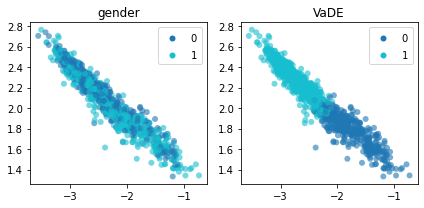

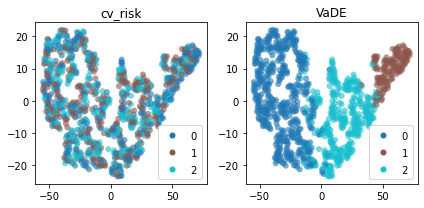

In [14]:
rl_method = "VaDE"
clust_method = "GMM"
verbose=0

for k, (name, labels) in zip (cluster_numbers, true_labels.items()):
    LATENT_DIM = k
    N_CLUSTERS = k
    
    # Construct and train the VaDE model.
    # If loss == NaN: retry.
    while True:
        # Construct models and pretrain AE
        print(f"K={k} - Pretraining AE", end=" ")
        model_pretrain, model_vade = get_vade_models(N_CLUSTERS, INPUT_DIM, LATENT_DIM, INTERMEDIATE_DIMS)
        optimizer = keras.optimizers.SGD(learning_rate=LEARNING_RATE_PRETRAIN,
                                         momentum=MOMENTUM_PRETRAIN)
        loss = keras.losses.BinaryCrossentropy()
        model_pretrain.compile(optimizer=optimizer, loss=loss)
        history = model_pretrain.fit(data,
                                     epochs=EPOCHS_PRETRAIN,
                                     batch_size=BATCH_SIZE,
                                     verbose=0)
        print(f"[loss: {history.history['loss'][-1]:.4f}]", end=" ")

        # Initialize parameters
        z_vade = model_vade.encode_only_mu(data)
        gmm = GaussianMixture(n_components=N_CLUSTERS, covariance_type='diag', n_init=30)
        gmm.fit(z_vade)
        for weight in model_vade.trainable_weights:
            if weight.name == "pi:0":
                weight.assign(K.log(K.constant(gmm.weights_)))
            elif weight.name == "mu:0":
                weight.assign(K.constant(gmm.means_))
            elif weight.name == "logvar:0":
                weight.assign(K.log(K.constant(gmm.covariances_)))

        # Fine-tune the model
        print("- Fine-tunning VaDE", end=" ")
        optimizer = keras.optimizers.SGD(learning_rate=LEARNING_RATE_FINETUNE,
                                         momentum=MOMENTUM_FINETUNE)
        model_vade.compile(optimizer=optimizer)
        history = model_vade.fit(data,
                                 epochs=EPOCHS_FINETUNE,
                                 batch_size=BATCH_SIZE,
                                 callbacks = callback,
                                 verbose=verbose)
        #If loss == NaN: retry.
        if np.isnan(history.history['loss'][-1]):
            print("[loss: NaN. Retrying.]")
            continue
        else:
            print(f"[loss: {history.history['loss'][-1]:.4f}]")
            break

    # Compute the cluster assignments
    c_vade = model_vade.classify(data).numpy()
    cluster_labels.append({"rl_method": rl_method, 
                           "clust_method": clust_method, 
                           "n_clusters": k, 
                           "labels": c_vade})
    
    # Compute metrics
    z_vade = model_vade.encode_only_mu(data)
    results.append(compute_metrics(rl_method, clust_method, k, name, z_vade, labels, c_vade, samples))
    
    # Draw the embeddings
    if k == 2:
        points = z_vade
    else:
        tsne = TSNE(n_components=2, init='pca')
        points = tsne.fit_transform(z_vade)

    show_labels = {name: labels.to_numpy(),
                   rl_method: c_vade}
    draw_multiple_labels(points, show_labels, subplot_size=(3,3), alpha=0.6)

# Results

## Metrics

In [15]:
results = pd.DataFrame(results)
# Save the ametrics on a CSV file
results.to_csv("results/metrics_deepclust.csv", index=False)

results_mean = results.set_index(["rl_method","clust_method"]).groupby(level=[0,1]).mean()
results_mean = results_mean.iloc[:,1:]
metrics=['same_clust','Acc','ARI','AMI','Sil']
results_mean.style.background_gradient(axis=0, cmap="cividis", text_color_threshold=0.3, subset=metrics).format('{:.2f}', subset=metrics)

,,same_clust,Acc,ARI,AMI,Sil
rl_method,clust_method,,,,,
DEC,K-Means,0.25,0.45,0.00,0.00,0.94
VaDE,GMM,0.25,0.45,0.00,0.00,0.51


In [16]:
results.style.background_gradient(axis=0, cmap="cividis", text_color_threshold=0.3, subset=metrics).format('{:.2f}', subset=metrics)

,rl_method,clust_method,n_clusters,variable,same_clust,Acc,ARI,AMI,Sil
0,DEC,K-Means,2,gender,0.35,0.55,0.00,0.00,0.96
1,DEC,K-Means,3,cv_risk,0.15,0.36,0.00,0.00,0.93
2,VaDE,GMM,2,gender,0.30,0.55,0.00,0.00,0.57
3,VaDE,GMM,3,cv_risk,0.20,0.36,0.00,0.00,0.45


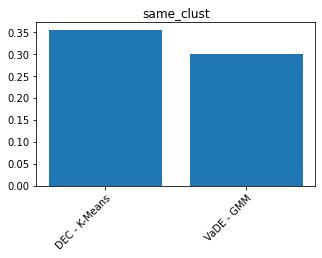

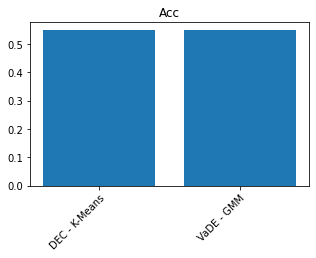

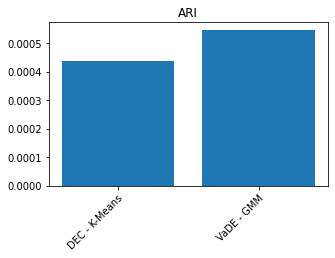

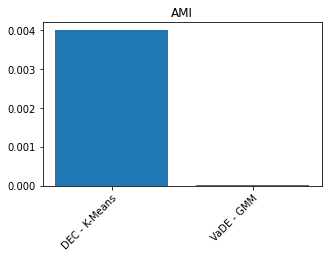

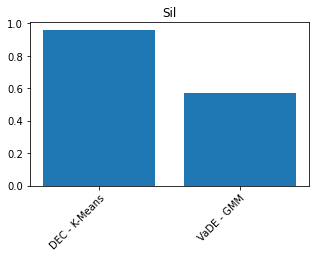

In [17]:
labels = (results.rl_method + " - " + results.clust_method)

for metric in (results.same_clust, results.Acc, results.ARI, results.AMI, results.Sil):
    plt.subplots(figsize=(5,3))
    plt.bar(labels, metric)
    plt.title(metric.name)
    plt.xticks(rotation=45, rotation_mode="anchor", ha='right')
    plt.show()

It doesn't seem that there is much agreement between the clusters assignments and the true categorical classes.
But some of the methods achieve assigning the same cluster to all the samples of the same individual.

## Compare assignments

In [18]:
labels = pd.DataFrame([d['labels'] for d in cluster_labels])
methods = pd.DataFrame(cluster_labels).loc[:,('rl_method', 'clust_method', 'n_clusters')]
cluster_labels_df = pd.concat((methods, labels), axis=1)

# Save the assignments on a CSV file
pd.DataFrame(cluster_labels_df).to_csv("results/assign_deepclust.csv", index=False)

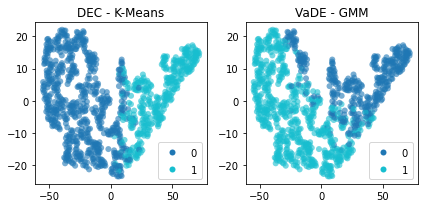

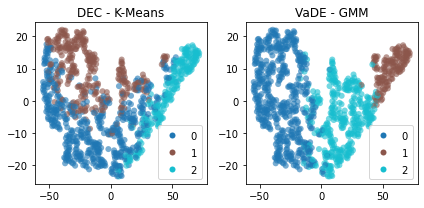

In [19]:
for k in cluster_numbers:
    clusters = cluster_labels_df[cluster_labels_df.n_clusters==k]
    show_labels = {clusters.rl_method[i] + " - " + clusters.clust_method[i]: clusters.loc[i,0:] for i in clusters.index}
    draw_multiple_labels(points, show_labels, max_cols=3, subplot_size=(3,3), alpha=0.6)

The cluster assignments shows some overlapping, both between 2 and 3 groups, and between the different methods.

## Clusters vs health indicators

Finally, I'll plot the health indicators and color the cluster assignments.
If there were a clear relation between the clusters and some of the variables,
It should be easy to detect it on the plots.

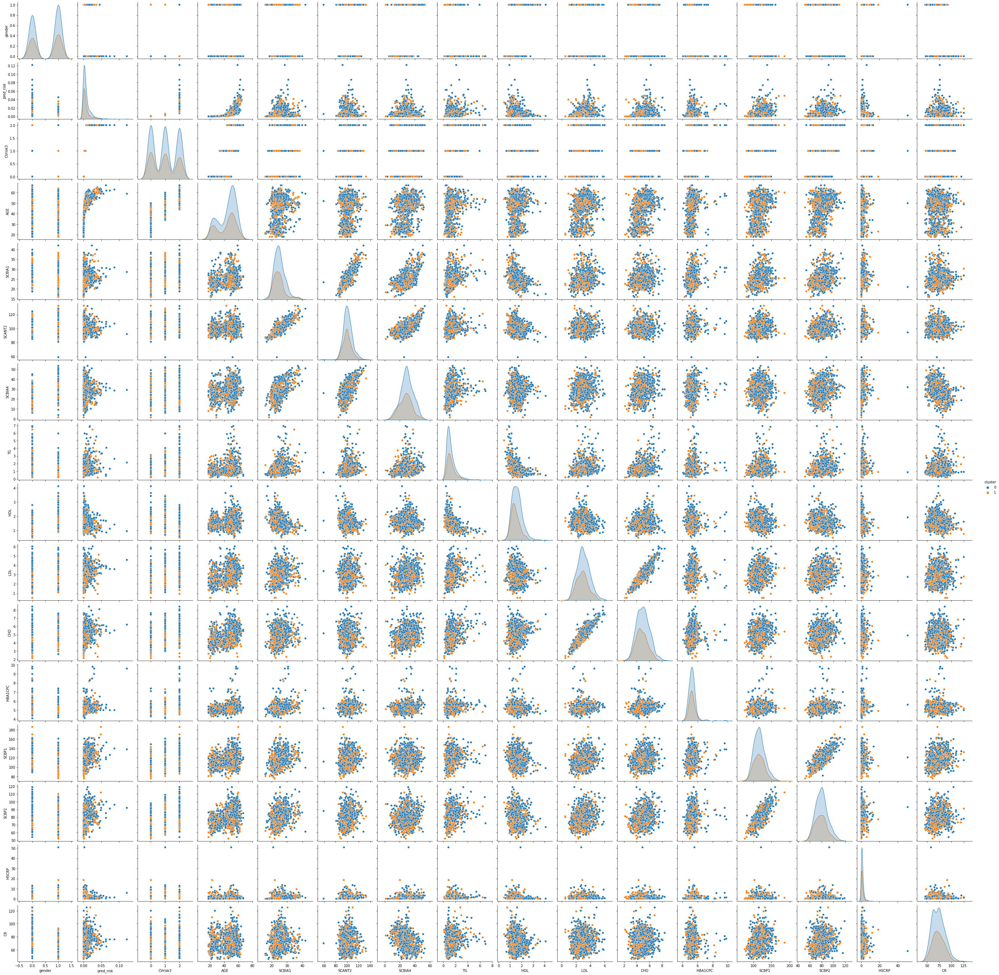

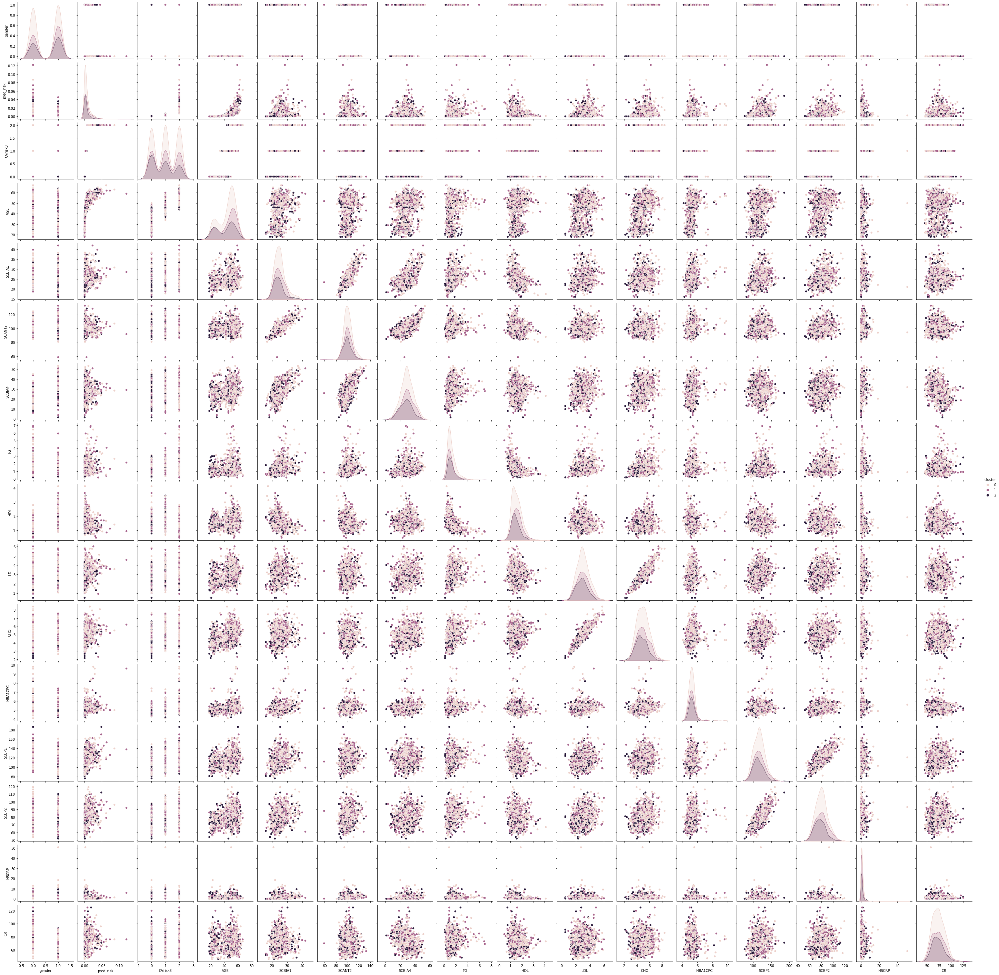

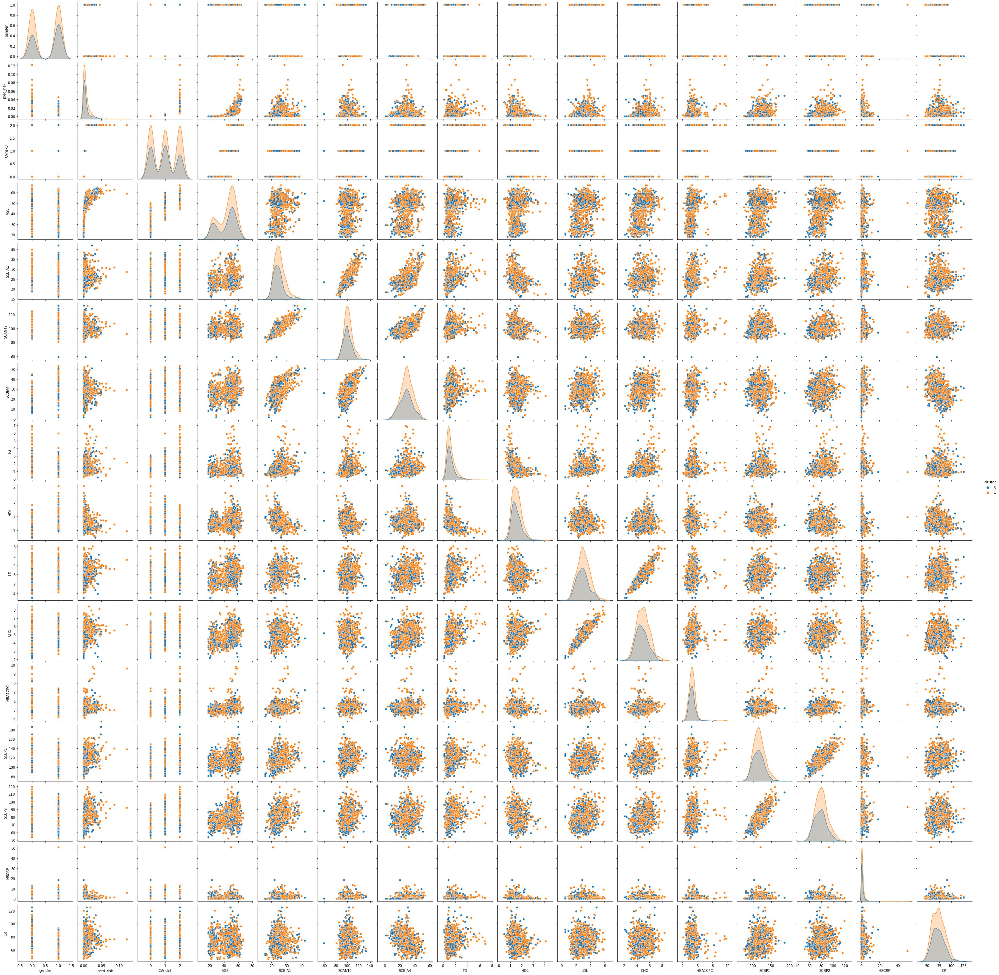

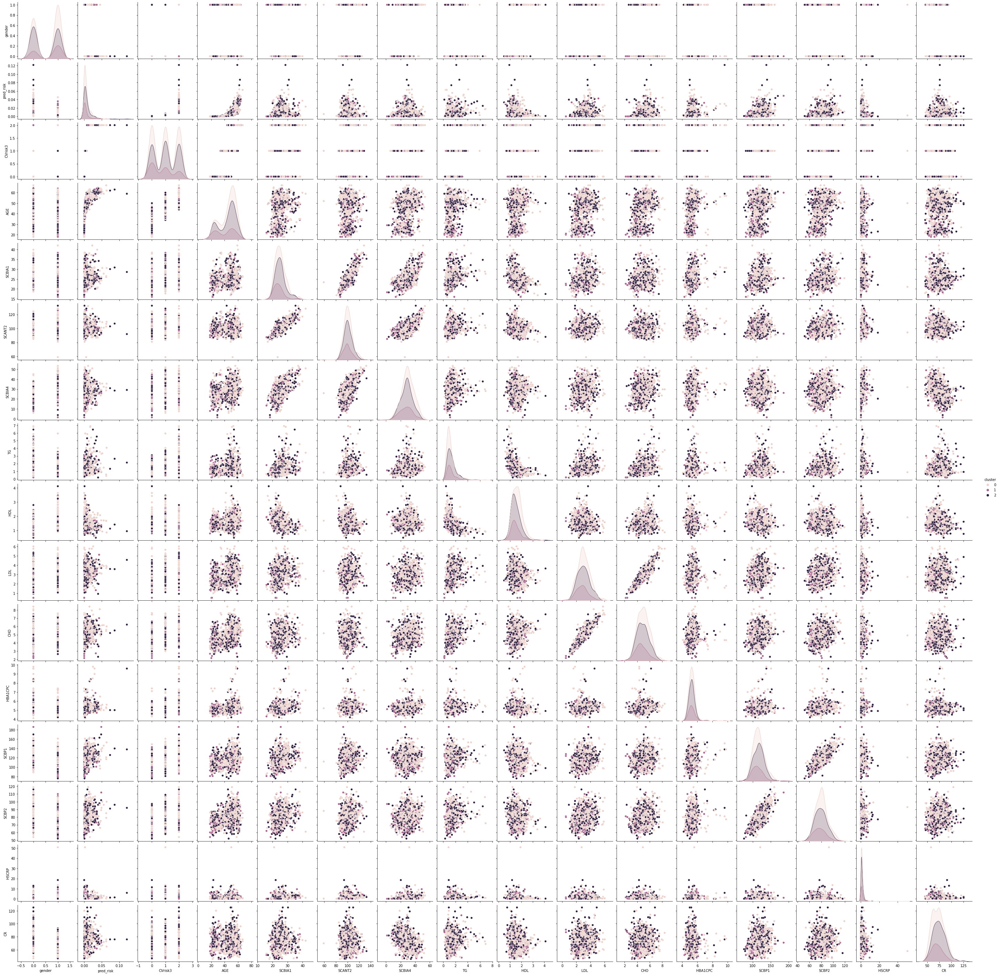

In [20]:
for idx in cluster_labels_df.index:
    samples['cluster'] = list(cluster_labels_df.loc[idx,0:])
    sns.pairplot(samples.iloc[:,3:], hue='cluster')
    plt.show()